In [90]:
import matplotlib.pyplot as plt 
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,3)
from statsmodels.graphics.tsaplots import plot_acf
import numpy as np 
from numpy.fft import rfftfreq, irfft
from numpy.random import normal
from IPython.display import Audio
import random
from scipy.io.wavfile import *
import librosa
from librosa import display

In [91]:
# Using the Nyquist-Shannon theorem
FRAMERATE = 44100

In [92]:
def play_sound(wave, framerate = FRAMERATE):
    #Plays a sound wave expressed as an array of values
    return Audio(wave, rate = framerate, autoplay=True)

In [93]:
def show_spectrogram(wave):
    #Shows spectrogram of input wave
    X = librosa.stft(wave)
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=FRAMERATE, x_axis='time', y_axis='log')

In [94]:
def gaussian_noise(power, duration = 1, framerate = FRAMERATE, min_frequency = 20, max_frequency = 20000):
    """
    Method to create gaussian noise inspired by https://github.com/felixpatzelt/colorednoise, the algorithm comes from :
    On generating power law noise. by Timmer and Koenig
    Astron. Astrophys (1995)

    :param power: power to which to elevate the frequencies of the form 1/(f^power) (0 -> white noise, 1 -> pink noise, 2 -> brown noise)
    :param duration: duration in seconds of the sample to create
    :param framerate: number of sample per second
    :param min_frequency: minimum frequency possible in the output, here set as the minimum frequency of the human hearing spectrum
    :param max_frequency: maximum frequency possible in the output, here set as the maximum frequency of the human hearing spectrum
    :return: a numpy array of length duration * framerate representing the sound value at each frame
    """
    # total number of frames in the output
    length = duration * framerate

    # generating sample frequencies in the Fourier domain
    sample_frequencies = rfftfreq(length)
    
    # frequency is in hertz = 1/s => the order is reversed for time periods
    min_period = 1 / float(max_frequency)
    max_period = 1 / float(min_frequency)
    
    # cutting of the array of frequencies at the minimum frequency
    nb_low_period = np.sum(sample_frequencies < min_period)
    if 0 < nb_low_period < len(sample_frequencies):
        sample_frequencies[:nb_low_period] = sample_frequencies[nb_low_period]

    # cutting of the array of frequencies at the minimum frequency
    nb_high_period = np.sum(sample_frequencies > max_period)
    if 0 < nb_high_period < len(sample_frequencies):
        index = len(sample_frequencies) - nb_high_period
        sample_frequencies[index:] = sample_frequencies[index - 1]
    
    # scaling factors
    scaling_factors = sample_frequencies ** (-power/2.0)

    
    # Generating scaled random power + phase
    scaled_power = normal(scale=scaling_factors, size=np.array([len(sample_frequencies)]))
    scaled_phase = normal(scale=scaling_factors, size=np.array([len(sample_frequencies)]))
    
    # Combining power and phase
    signal  = scaled_power + 1J * scaled_phase
    
    # Using the inverse Fourier transform to go back to the time domain
    output = irfft(signal, n=length, axis=-1)
    
    return output

# Part 1
The exposition starts with Brownian noise to which we gradually add notes from the Bolero (parts below). We tried to use different colours of noise by using different exponents in our gaussian noise method and explain our choice for Brown noise below.

In [96]:
# not chosen as it doesn't induce the wanted effect on the listener, isn't calming and grounding as an exposition 
# should be and nearly sounds distracting
white_noise = gaussian_noise(0, duration = 10)
play_sound(white_noise)

In [98]:
# for similar reasons to white noise, we didn't choose pink_noise as it still isn't very pleasant to listen to
pink_noise = gaussian_noise(0, duration = 10)
play_sound(pink_noise)

In [99]:
# we chose to work with brown noise as it is much "smoother", nearly holding some reminiscence of the 
# sound of waves, and works well as a calm eposition
brown_noise = gaussian_noise(2, duration = 100)
play_sound(brown_noise)

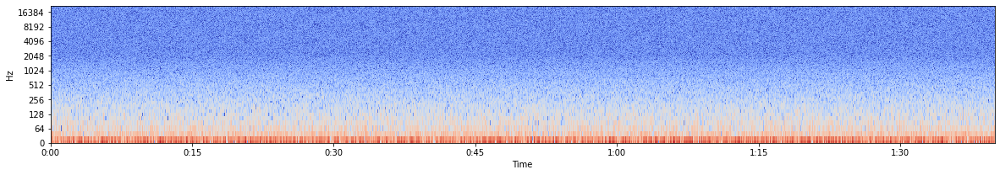

In [101]:
# on the brown noise's spectrogram, we can see the decay in the associated power as the frequency increases
show_spectrogram(brown_noise)

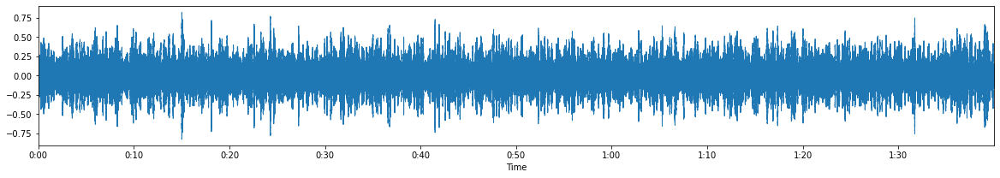

In [102]:
# wave plot of the brown noise
librosa.display.waveplot(out, sr=FRAMERATE);

In the exposition part of the composition, we use a .wav file which we will then merge with the rest of part 1 (during which we gradually add notes from the Bolero) by hand for 2 main reasons. 
    
Firstly, a wav file is much more appropriate to generate brown noise (it would probably be unfeasible in music21), similarly, it is much easier to add notes from a midi file using music21 streams than raw waves. 
    
Secondly, this will allow us to make the appearance of notes after the exposition much smoother (we could for example make the percussions out of samples of brown noise...).

In [108]:
# we divide by 2 to reduce the amplitude of the waves (the traduction to a wav file sometimes struggled if the waves
# had too big an amplitude), the file saving is commented out (the file is already in the media folder)

# write("brown_noise.wav", FRAMERATE, out / 2.0) 